In [23]:
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sbn
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from matplotlib.font_manager import FontProperties
import graphviz
import os
from pandas_profiling import ProfileReport


In [12]:
from sklearn.naive_bayes import GaussianNB # continuous variables (Predictor Variables)
from sklearn.tree import DecisionTreeClassifier, export_graphviz


In [13]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.feature_selection import chi2, f_classif
from sklearn.impute import KNNImputer # Missing values

In [14]:
Data = pd.read_csv("winequality-red.csv")
Data_copy = Data.copy()
pd.set_option("display.max_columns", 12)
Data.head()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [15]:
ProfileReport(Data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
# Quality > 6 ---> Quality = 1 // Quality <= 6 ---> Quality = 0
Data["quality"] = np.where(Data["quality"] > 6, 1, 0)

In [17]:
Missing_values_percent = 100*(Data.isnull().sum()/len(Data["quality"]))
print(Missing_values_percent)

fixed acidity           0.0
volatile acidity        0.0
citric acid             0.0
residual sugar          0.0
chlorides               0.0
free sulfur dioxide     0.0
total sulfur dioxide    0.0
density                 0.0
pH                      0.0
sulphates               0.0
alcohol                 0.0
quality                 0.0
dtype: float64


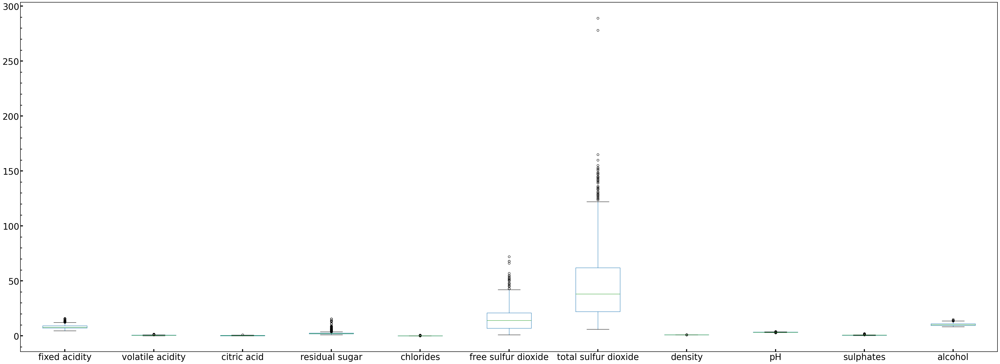

In [25]:
fig, ax = plt.subplots(figsize = (50, 18))
Data.boxplot(column= ["fixed acidity", "volatile acidity", "citric acid", "residual sugar", "chlorides", "free sulfur dioxide", "total sulfur dioxide", "density", "pH", "sulphates", "alcohol"], grid = False)
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(axis = "both", direction = "in", labelcolor='black', labelsize=25, top = False, right = False)
ax.tick_params(which = "major", direction = "in", color='black', length=7, width = 3)
ax.tick_params(which = "minor", direction = "in", color='black', length=4, width = 2, top = False, right = False, bottom = False)
for axis in ["left", "bottom", "right", "top"]:
    ax.spines[axis].set_linewidth(1.4)
plt.show()

In [21]:
Data.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

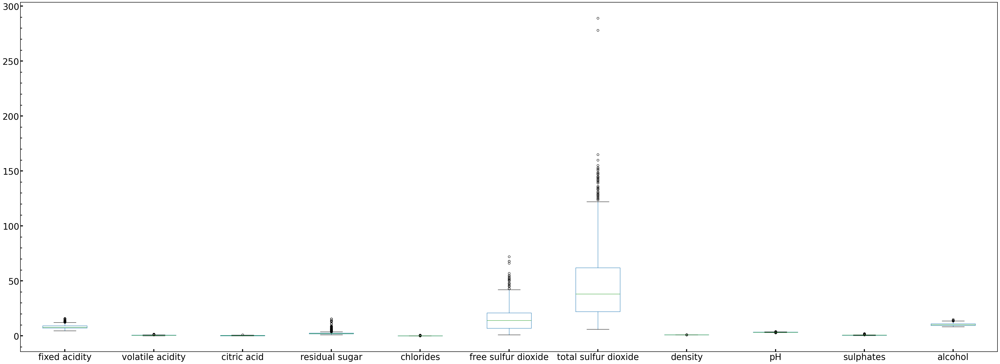

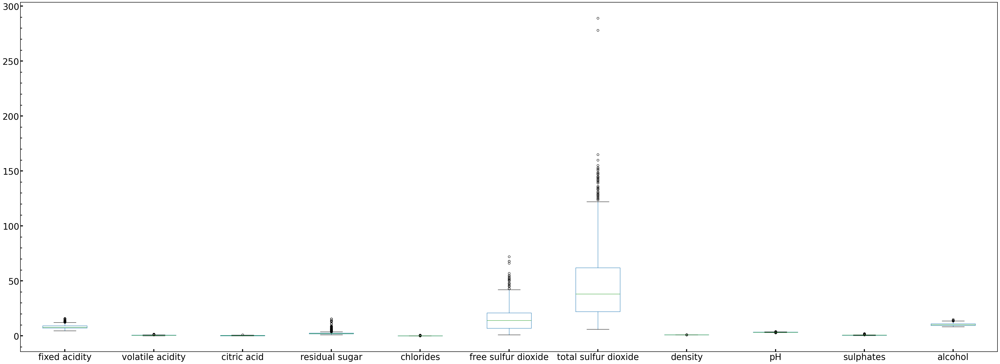

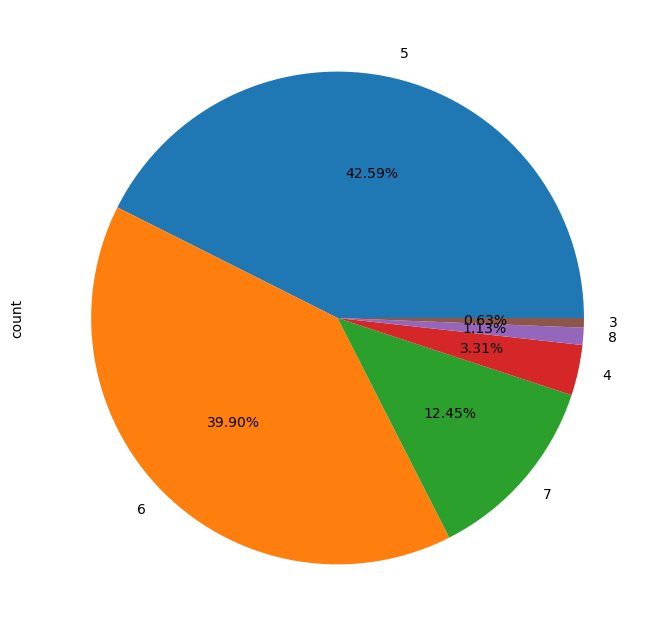

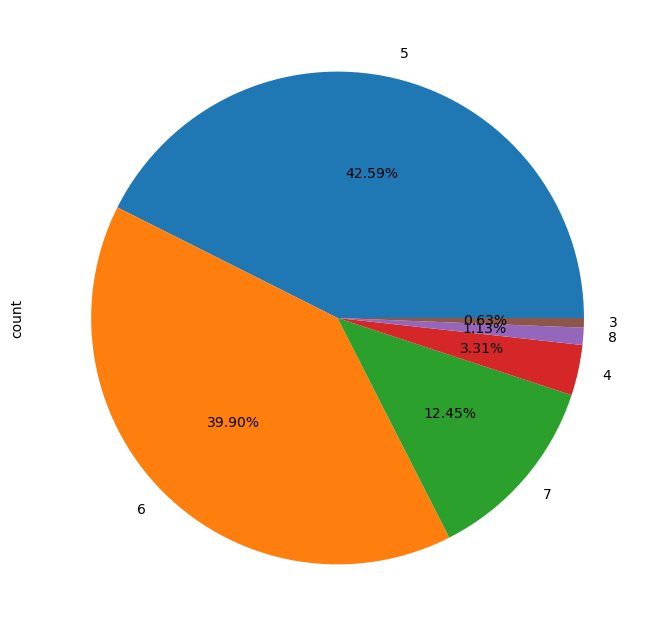

In [24]:
plt.figure(figsize = (8,8))
Data_copy['quality'].value_counts().plot.pie(autopct="%1.2f%%")
plt.show()

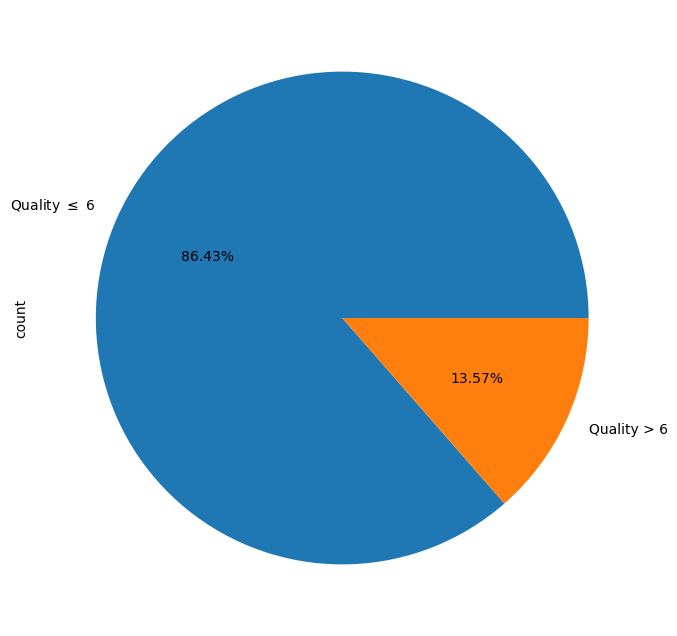

In [26]:
plt.figure(figsize = (8,8))
Data_copy2 = Data.copy()
Data_copy2["quality"] = Data_copy2["quality"].replace({1: "Quality > 6", 0: "Quality $\leq$ 6"})
Data_copy2["quality"].value_counts().plot.pie(autopct="%1.2f%%")
plt.show()

<Figure size 5000x5000 with 0 Axes>

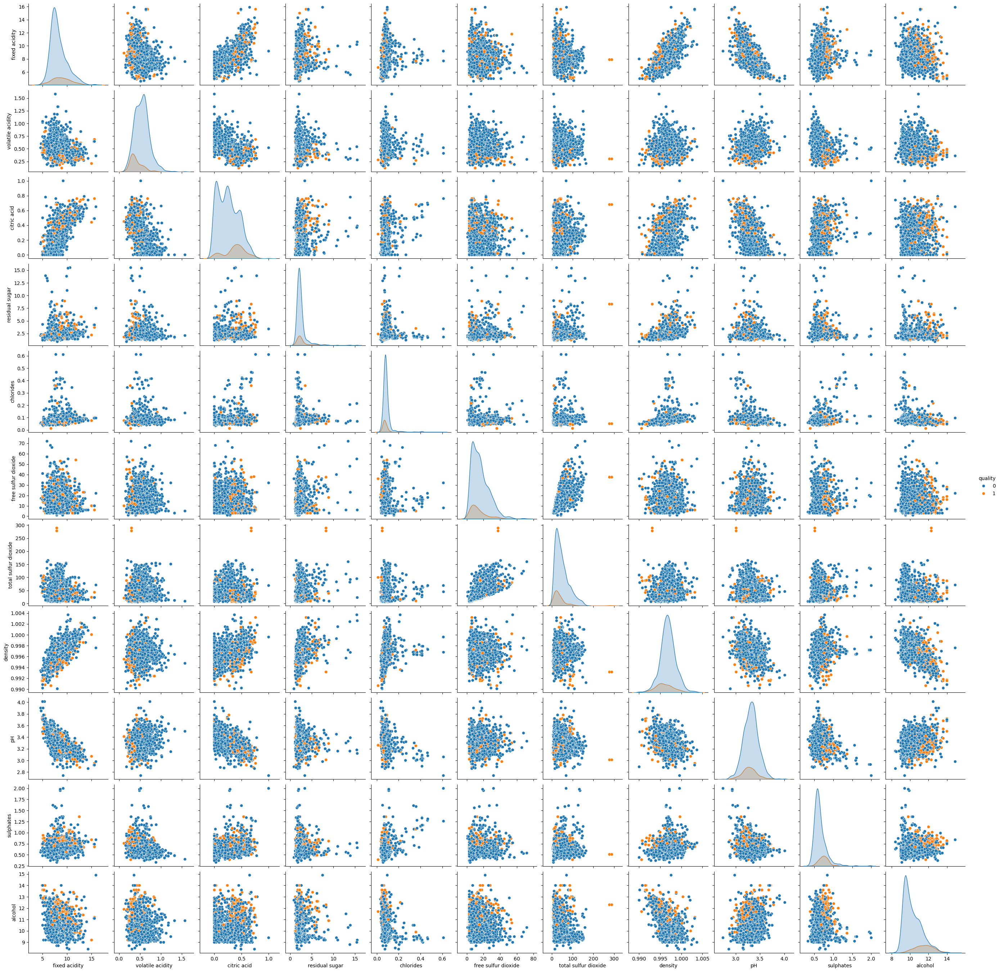

In [27]:
plt.figure(figsize = (50, 50))
sbn.pairplot(Data, hue = "quality")
plt.show()

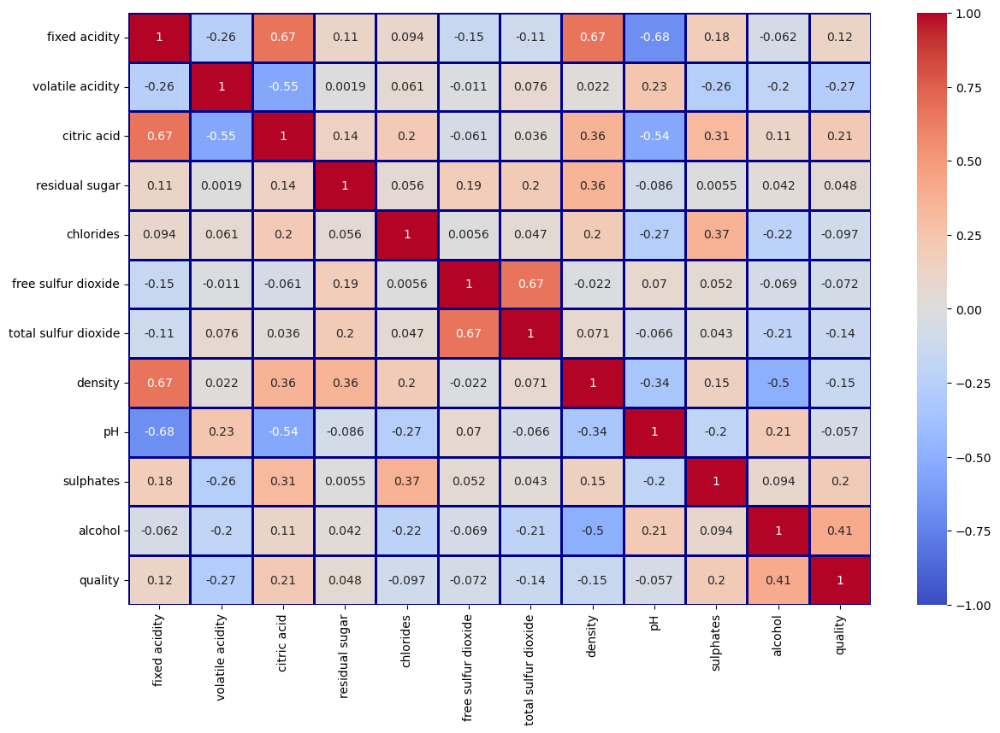

In [28]:
plt.figure(figsize = (14, 9))
sbn.heatmap(Data.corr(), annot = True, vmin = -1, vmax = +1, cmap = "coolwarm",  linewidth = 2.1, linecolor = "darkblue")
plt.show()

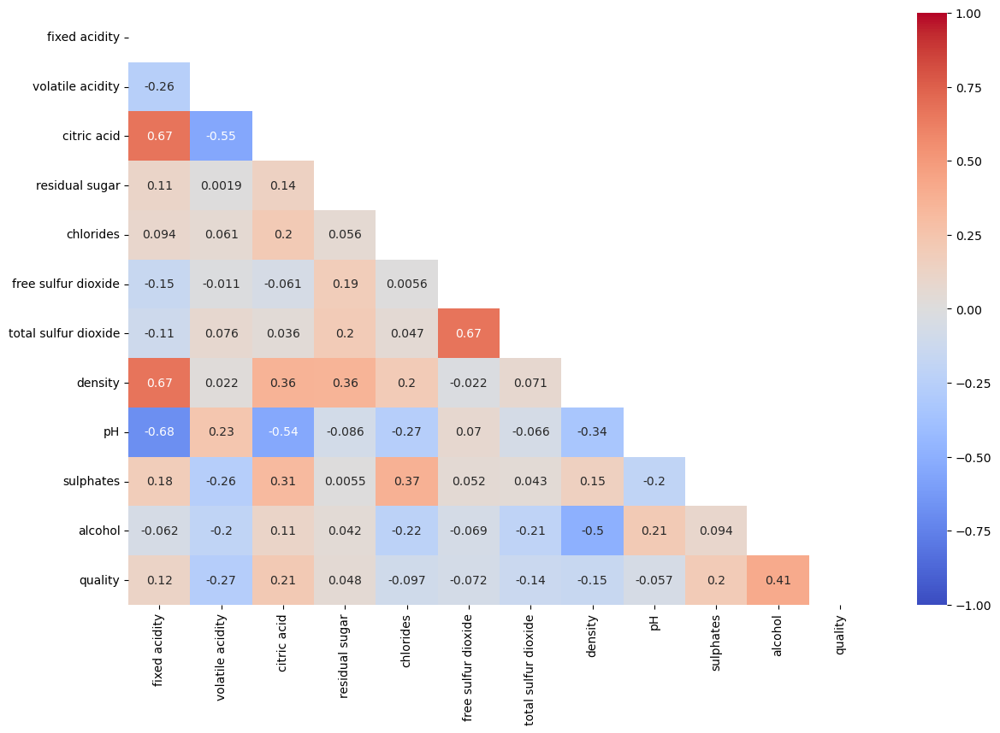

In [29]:
plt.figure(figsize = (14, 9))
triu = np.triu(Data.corr())
sbn.heatmap(Data.corr(), annot = True, vmin = -1, vmax = +1, cmap = "coolwarm", mask = triu)
plt.show()

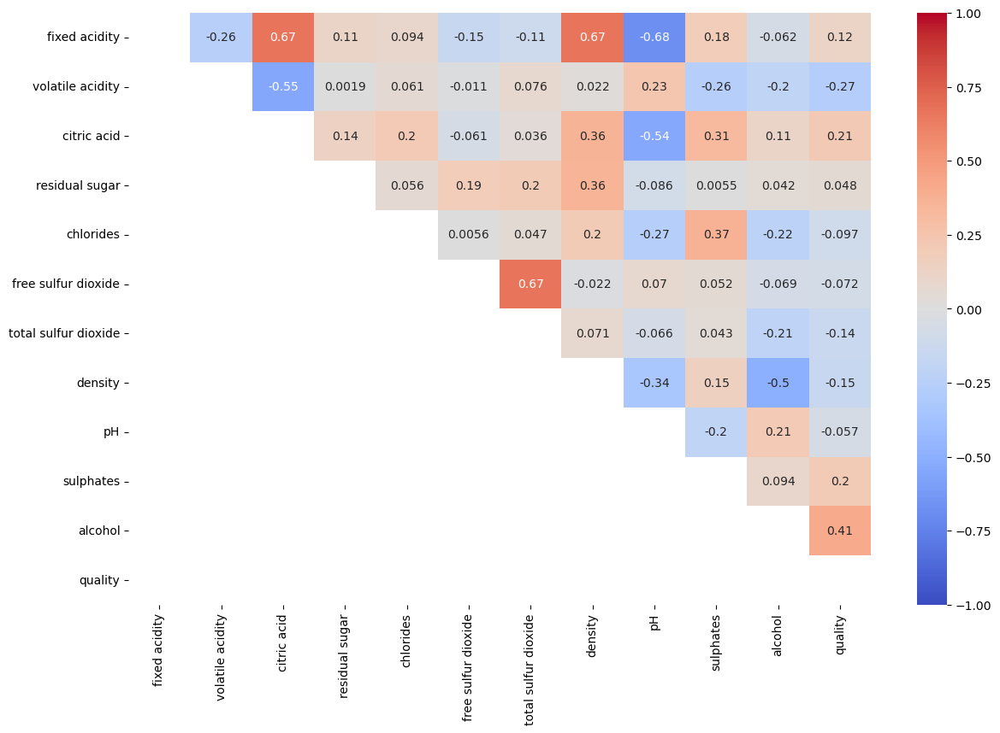

In [30]:
plt.figure(figsize = (14, 9))
tril = np.tril(Data.corr())
sbn.heatmap(Data.corr(), annot = True, vmin = -1, vmax = +1, cmap = "coolwarm", mask = tril)
plt.show()

In [31]:
x = Data.drop("quality", axis = 1)
y = Data["quality"]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.33, random_state = 9)

Decision Tree

In [32]:
criterion = ["gini", "entropy"]
ModelTree = DecisionTreeClassifier()
max_depth = np.array([2, 3, 4, 5, 6, 7, 8, 9])
min_samples_split = np.array([2, 3, 4, 5, 6, 7, 8, 9])
param_grid = {"criterion": criterion, "max_depth": max_depth, "min_samples_split": min_samples_split}
GridTree = GridSearchCV(estimator = ModelTree, param_grid = param_grid, cv = 5, n_jobs = 3)
GridTree.fit(x_train, y_train)
print(GridTree.best_estimator_.criterion)
print(GridTree.best_estimator_.max_depth)
print(GridTree.best_estimator_.min_samples_split)

gini
6
2


In [33]:
ModelTree = DecisionTreeClassifier(max_depth = 6, min_samples_split=6)
ModelTree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=6, min_samples_split=6)

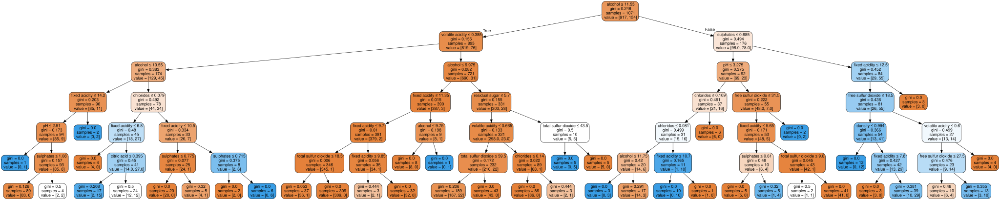

In [35]:
Data_dot = export_graphviz(ModelTree, out_file = None, feature_names = list(x_train.columns), filled = True,
               rounded = True, special_characters = True, leaves_parallel = False, rotate = False)
graphviz.Source(Data_dot)

In [36]:
y_predTree = ModelTree.predict(x_test)

In [37]:
MatrixTree = confusion_matrix(y_test, y_predTree)

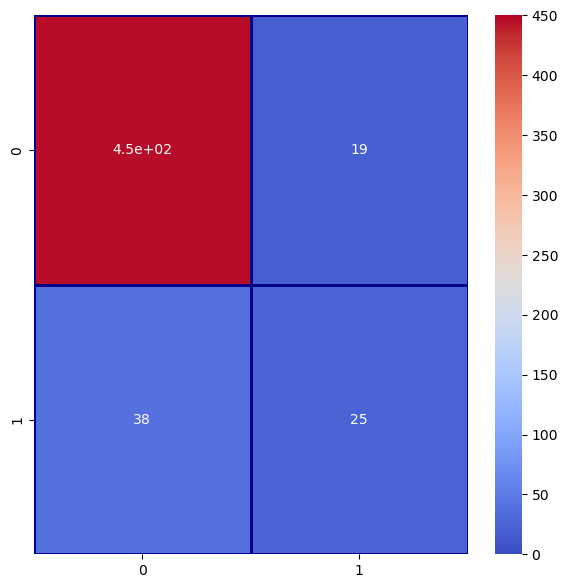

In [38]:
plt.figure(figsize = (7, 7))
sbn.heatmap(MatrixTree, annot = True, vmin = 0, vmax = 450, cmap = "coolwarm",  linewidth = 2.1, linecolor = "darkblue")
plt.show()

In [40]:
print(f"Accuracy: {accuracy_score(y_test, y_predTree)}")
print(f"Recall: {recall_score(y_test, y_predTree)}")
print(f"Precision: {precision_score(y_test, y_predTree)}")
print(f"f1_score: {f1_score(y_test, y_predTree)}")

Accuracy: 0.8920454545454546
Recall: 0.3968253968253968
Precision: 0.5681818181818182
f1_score: 0.4672897196261682


NAIVE BAYES


In [41]:
ModelNB = GaussianNB()
ModelNB.fit(x_train, y_train)

GaussianNB()

In [42]:
y_predNB = ModelNB.predict(x_test)

In [43]:
MatrixNB = confusion_matrix(y_test, y_predNB)

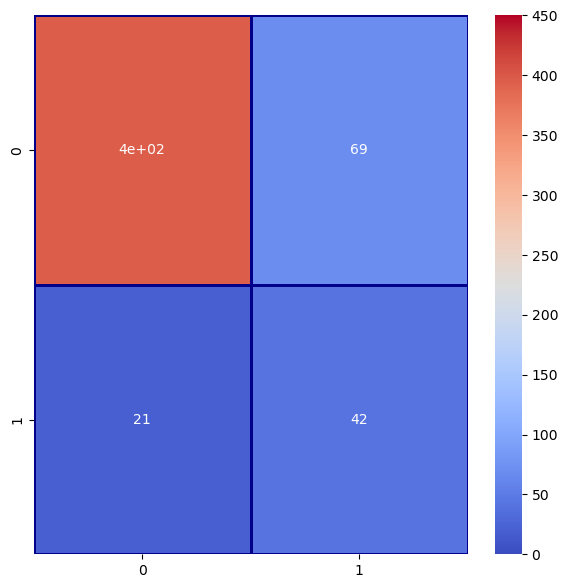

In [45]:
plt.figure(figsize = (7, 7))
sbn.heatmap(MatrixNB, annot = True, vmin = 0, vmax = 450, cmap = "coolwarm",  linewidth = 2.1, linecolor = "darkblue")
plt.show()

In [46]:
print(f"Accuracy: {accuracy_score(y_test, y_predNB)}")
print(f"Recall: {recall_score(y_test, y_predNB)}")
print(f"Precision: {precision_score(y_test, y_predNB)}")
print(f"f1_score: {f1_score(y_test, y_predNB)}")

Accuracy: 0.8295454545454546
Recall: 0.6666666666666666
Precision: 0.3783783783783784
f1_score: 0.4827586206896552
